## Load Data

In [1]:
import pandas as pd
import numpy as np
import datetime
from meteocalc import feels_like

import matplotlib.pyplot as plt
import plotly.express as px
# import lightgbm as lgb
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [2]:
meta_df = pd.read_csv('../data/building_metadata.csv')
train_df = pd.read_csv('../data/train.csv', parse_dates=["timestamp"])
# test_df = pd.read_csv('../data/test.csv', parse_dates=["timestamp"])
weather_train_df = pd.read_csv('../data/weather_train.csv', parse_dates=["timestamp"])
weather_test_df = pd.read_csv('../data/weather_test.csv', parse_dates=["timestamp"])

## Data Exploration
### Missing Data
The given datasets include numerous missing data, which can affect the predictive model's performance and reliability. The missing rate is quite different among the features. For example, in the **building_metadata**, *year_built* and *floor_count* are missing 53% and 75% respectively. However, the other 4 features do not contain missing value. In addition, the missing rate is depending on the locations. For example, there is no missing *year_built* value when *site_id* = 0, but the same feature is totally missing when *site_id* is 6 or 8-14. Moreover, many *timestamp* are missing in **weather_train_df**, and it can cause serious problems when *train_df* and *weather_train_df* will be merged. Therfore, missing data should be handled before the analysis and I will introduce how I deal with the missing variables in the next section.

In [3]:
meta_df.isna().sum()/len(meta_df)

site_id        0.000000
building_id    0.000000
primary_use    0.000000
square_feet    0.000000
year_built     0.534161
floor_count    0.755003
dtype: float64

In [4]:
weather_train_df.isna().sum()/len(weather_train_df)

site_id               0.000000
timestamp             0.000000
air_temperature       0.000393
cloud_coverage        0.494895
dew_temperature       0.000808
precip_depth_1_hr     0.359791
sea_level_pressure    0.075966
wind_direction        0.044844
wind_speed            0.002175
dtype: float64

In [5]:
def missing_ratio(df, col):
    missing = df[['site_id', col]][df[col].isna()].fillna(0).groupby('site_id').count()
    total = df[['site_id', col]].fillna(0).groupby('site_id').count()
    total = total.merge(missing, on='site_id', how='left').fillna(0)
    total['Missing_rate'] = total[col+'_y']/total[col+'_x']
    total.rename(columns={col+'_y': "Missing", col+'_x': "Total"}, inplace=True)
    total.Missing = total.Missing.astype(int)
    total.reset_index(inplace=True)
    return total

In [6]:
missing = missing_ratio(meta_df, 'year_built')
missing

,site_id,Total,Missing,Missing_rate
0,0,105,0,0.000000
1,1,51,11,0.215686
2,2,135,41,0.303704
3,3,274,142,0.518248
4,4,91,2,0.021978
5,5,89,1,0.011236
6,6,44,44,1.000000
7,7,15,1,0.066667
8,8,70,70,1.000000
9,9,124,124,1.000000


In [7]:
missing = missing_ratio(weather_train_df, 'sea_level_pressure')
missing['Missing_Hours'] = 8784 - missing.Total
missing

,site_id,Total,Missing,Missing_rate,Missing_Hours
0,0,8784,85,0.009677,0
1,1,8763,52,0.005934,21
2,2,8783,44,0.005010,1
3,3,8780,158,0.017995,4
4,4,8783,73,0.008312,1
5,5,8755,8755,1.000000,29
6,6,8782,175,0.019927,2
7,7,8614,8,0.000929,170
8,8,8784,85,0.009677,0
9,9,8780,239,0.027221,4


## Data Engineering
### Fill missing hours
2016 is a reap year, which means that it has 366 days and hourly data in 2016 should have 8784 hours data. However, there exists some missing hours in **weather_train**. If we do not fill the hours and just join the weather data and the training set, some hours will not have any weather information. Therefore, I fill the missing hours and also fill some missing weather data with interpolation. It is very useful to fill missing time series data because time series data is highly correlated to the previous values and the next values. 

In [8]:
def fill_hours(df):
    timestamp = df[df.site_id == 0]['timestamp'].reset_index()
    fill_hours = df[df.site_id == 0].copy()
    
    for i in range(1,16):
        temp = timestamp.merge(df[df.site_id == i], on='timestamp', how='left')
        temp.drop('index', axis = 1, inplace=True)
        temp.site_id = i
        fill_hours = pd.concat([fill_hours, temp], sort=False).reset_index(drop=True)
    
    return fill_hours

def fill_vars(df):

    temp = pd.DataFrame()
    for i in range(16):
        col = ['site_id', 'timestamp', 'air_temperature', 'dew_temperature', 'sea_level_pressure', 
               'wind_direction', 'wind_speed']
        interpol = df[col][df.site_id == i].interpolate(method='linear', limit_direction='both', axis=0)
        temp = pd.concat([temp, interpol], sort=False).reset_index(drop=True)

    df[col] = temp
    
    return df

In [9]:
weather_train_df = fill_hours(weather_train_df)
weather_test_df = fill_hours(weather_test_df)

weather_train_df['precip_depth_1_hr'][weather_train_df['precip_depth_1_hr'] == -1] = 0
weather_test_df['precip_depth_1_hr'][weather_test_df['precip_depth_1_hr'] == -1] = 0

weather_train_df = fill_vars(weather_train_df)
weather_test_df = fill_vars(weather_test_df)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


### Extract more features from the given data
I extract some useful time features from timestamp. Also, I adopted the other participant's method which can calculate humidity and feels-like temperature.

In [10]:
def date_features(df):
    
    df['hour'] = df.timestamp.dt.hour
    df['year'] = df.timestamp.dt.year
    df['month'] = df.timestamp.dt.month
    df['dayofmonth'] = df.timestamp.dt.day
    df['dayofweek'] = df.timestamp.dt.dayofweek
    
    holidays = {"2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
            "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
            "2017-01-02", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
            "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
            "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
            "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25"}
    df['is_holiday'] = 0
    df['is_holiday'][df.timestamp.isin(holidays)] = 1
    
    return df

# https://www.kaggle.com/ragnar123/another-1-08-lb-no-leak
def get_meteorological_features(data):
    def calculate_rh(df):
        df['relative_humidity'] = 100 * (np.exp((17.625 * df['dew_temperature']) \
                / (243.04 + df['dew_temperature'])) / np.exp((17.625 * df['air_temperature'])\
                /(243.04 + df['air_temperature'])))
    def calculate_fl(df):
        flike_final = []
        flike = []
        # calculate Feels Like temperature
        for i in range(len(df)):
            at = df['air_temperature'][i]
            rh = df['relative_humidity'][i]
            ws = df['wind_speed'][i]
            flike.append(feels_like(at, rh, ws))
        for i in range(len(flike)):
            flike_final.append(flike[i].f)
        df['feels_like'] = flike_final
    calculate_rh(data)
    calculate_fl(data)

    return data

In [11]:
weather_train_df = get_meteorological_features(weather_train_df)
weather_test_df = get_meteorological_features(weather_test_df)

weather_train_df = date_features(weather_train_df)
weather_test_df = date_features(weather_test_df)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [12]:
weather_train_df[['air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 
              'sea_level_pressure', 'wind_direction', 'wind_speed', 'relative_humidity', 'feels_like']].corr(method='pearson')

,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,relative_humidity,feels_like
air_temperature,1.000000,0.010291,0.792761,-0.014634,-0.209124,-0.098393,-0.058579,-0.340426,0.940439
cloud_coverage,0.010291,1.000000,0.183715,0.130961,-0.158087,0.052717,0.294077,0.262097,-0.078483
dew_temperature,0.792761,0.183715,1.000000,0.065192,-0.170685,-0.152747,-0.098165,0.273695,0.762539
precip_depth_1_hr,-0.014634,0.130961,0.065192,1.000000,-0.083228,-0.011848,0.038632,0.146072,-0.025293
sea_level_pressure,-0.209124,-0.158087,-0.170685,-0.083228,1.000000,-0.102143,-0.252719,0.007474,-0.112940
wind_direction,-0.098393,0.052717,-0.152747,-0.011848,-0.102143,1.000000,0.352590,-0.091712,-0.184738
wind_speed,-0.058579,0.294077,-0.098165,0.038632,-0.252719,0.352590,1.000000,-0.087649,-0.360707
relative_humidity,-0.340426,0.262097,0.273695,0.146072,0.007474,-0.091712,-0.087649,1.000000,-0.283489
feels_like,0.940439,-0.078483,0.762539,-0.025293,-0.112940,-0.184738,-0.360707,-0.283489,1.000000


### Impute cloud_coverage, precip_depth_1_hr, sea_level_pressure
Some variables, such as *cloud_coverage, precip_depth_1_hr, and sea_level_pressure*, cannot be filled only by interpolation. To deal with these data points, I explored many different approaches, including regression, auto encoder, and random forest. However, Multivariate Imputation by Chained Equations, called MICE, produced the most similar mean and variance to the original dataset. In scikit-learn, iterative imputer use this method.<br>
https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html

In [13]:
cols = weather_train_df.columns.tolist()
cols.remove('timestamp')
cols.remove('site_id')
cols.remove('is_holiday')

In [14]:
weather_df = pd.concat([weather_train_df, weather_test_df], axis=0).reset_index(drop=True)
weather_df.describe()

,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,relative_humidity,feels_like,hour,year,month,dayofmonth,dayofweek,is_holiday
count,420864.000000,420864.000000,207395.000000,420864.000000,271139.000000,394560.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000
mean,7.500000,14.235109,2.174377,7.374898,1.124892,1016.174039,179.506030,3.556174,68.526440,9.755036,11.500000,2016.999088,6.521898,15.732664,3.002737,0.001141
std,4.609778,10.746443,2.613391,10.061428,8.926884,7.838404,109.931116,2.319042,22.157114,12.751419,6.922195,0.816683,3.448990,8.801381,2.001597,0.033752
min,0.000000,-28.900000,0.000000,-35.000000,0.000000,968.200000,0.000000,0.000000,2.128345,-47.348130,0.000000,2016.000000,1.000000,1.000000,0.000000,0.000000
25%,3.750000,7.200000,0.000000,0.600000,0.000000,1011.640686,80.000000,2.100000,53.491397,1.235255,5.750000,2016.000000,4.000000,8.000000,1.000000,0.000000
50%,7.500000,15.000000,2.000000,8.300000,0.000000,1016.300000,190.000000,3.100000,72.793170,10.600000,11.500000,2017.000000,7.000000,16.000000,3.000000,0.000000
75%,11.250000,22.200000,4.000000,15.000000,0.000000,1020.800000,270.000000,4.810390,87.000902,19.400000,17.250000,2018.000000,10.000000,23.000000,5.000000,0.000000
max,15.000000,48.300000,9.000000,26.700000,597.000000,1050.100000,360.000000,24.200000,127.676396,48.300000,23.000000,2018.000000,12.000000,31.000000,6.000000,1.000000


In [15]:
from sklearn.preprocessing import MinMaxScaler

scale = MinMaxScaler()
weather_df[cols] = scale.fit_transform(weather_df[cols])

subset, _ = train_test_split(weather_df, train_size=0.5, random_state=12345)

In [16]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imputer = IterativeImputer(
    max_iter=200, min_value=0, max_value=1, tol=1e-4, random_state=20191207)
imputer.fit(subset[cols])
weather_filled_df = pd.DataFrame(scale.inverse_transform(imputer.transform(weather_df[cols])), columns=cols)
weather_df = pd.concat([weather_df[['timestamp', 'site_id', 'is_holiday']], weather_filled_df], axis=1)

In [17]:
weather_df.describe()

,site_id,is_holiday,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,relative_humidity,feels_like,hour,year,month,dayofmonth,dayofweek
count,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000,420864.000000
mean,7.500000,0.001141,14.235109,2.460821,7.374898,1.745606,1016.084242,179.506030,3.556174,68.526440,9.755036,11.500000,2016.999088,6.521898,15.732664,3.002737
std,4.609778,0.033752,10.746443,2.119092,10.061428,7.419086,7.629872,109.931116,2.319042,22.157114,12.751419,6.922195,0.816683,3.448990,8.801381,2.001597
min,0.000000,0.000000,-28.900000,0.000000,-35.000000,0.000000,968.200000,0.000000,0.000000,2.128345,-47.348130,0.000000,2016.000000,1.000000,1.000000,0.000000
25%,3.750000,0.000000,7.200000,0.574912,0.600000,0.000000,1011.800000,80.000000,2.100000,53.491397,1.235255,5.750000,2016.000000,4.000000,8.000000,1.000000
50%,7.500000,0.000000,15.000000,2.091551,8.300000,0.000000,1016.100000,190.000000,3.100000,72.793170,10.600000,11.500000,2017.000000,7.000000,16.000000,3.000000
75%,11.250000,0.000000,22.200000,3.665672,15.000000,1.630880,1020.400000,270.000000,4.810390,87.000902,19.400000,17.250000,2018.000000,10.000000,23.000000,5.000000
max,15.000000,1.000000,48.300000,9.000000,26.700000,597.000000,1050.100000,360.000000,24.200000,127.676396,48.300000,23.000000,2018.000000,12.000000,31.000000,6.000000


In [18]:
weather_df[['air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 
              'sea_level_pressure', 'wind_direction', 'wind_speed', 'relative_humidity', 'feels_like']].corr(method='pearson')

,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,relative_humidity,feels_like
air_temperature,1.000000,0.016999,0.789227,-0.048920,-0.241205,-0.105288,-0.062515,-0.309064,0.941538
cloud_coverage,0.016999,1.000000,0.227249,0.399525,-0.261615,0.023267,0.351019,0.370756,-0.089267
dew_temperature,0.789227,0.227249,1.000000,0.056274,-0.207318,-0.155159,-0.095946,0.308972,0.758460
precip_depth_1_hr,-0.048920,0.399525,0.056274,1.000000,-0.136377,0.002578,0.101448,0.196489,-0.073603
sea_level_pressure,-0.241205,-0.261615,-0.207318,-0.136377,1.000000,-0.090861,-0.244372,-0.012702,-0.144672
wind_direction,-0.105288,0.023267,-0.155159,0.002578,-0.090861,1.000000,0.346908,-0.088427,-0.189305
wind_speed,-0.062515,0.351019,-0.095946,0.101448,-0.244372,0.346908,1.000000,-0.079028,-0.361243
relative_humidity,-0.309064,0.370756,0.308972,0.196489,-0.012702,-0.088427,-0.079028,1.000000,-0.257396
feels_like,0.941538,-0.089267,0.758460,-0.073603,-0.144672,-0.189305,-0.361243,-0.257396,1.000000


### Merge datasets

In [19]:
train_df = train_df.merge(meta_df, on = 'building_id', how='left')
train_df = train_df.merge(weather_train_df, on = ['site_id', 'timestamp'], how='left')
test_df = test_df.merge(meta_df, on = 'building_id', how='left')
test_df = test_df.merge(weather_test_df, on = ['site_id', 'timestamp'], how='left')

### Drop nonsense values
In this part of notebook, I adopted other people's work. The original code can be found in https://www.kaggle.com/purist1024/ashrae-simple-data-cleanup-lb-1-08-no-leaks.<br>

In [20]:
def get_meter_name(df):
    name = {0: 'electricity', 1: 'chilledwater', 2: 'steam', 3: 'hotwater'}
    df['meter_name'] = df['meter'].map(name)
    
    return df

In [21]:
train_df = get_meter_name(train_df)
# test_df = get_meter_name(test_df)

In [13]:
# https://www.kaggle.com/purist1024/ashrae-simple-data-cleanup-lb-1-08-no-leaks

def make_is_bad_zero(Xy_subset, min_interval=48, summer_start=3000, summer_end=7500):
    """Helper routine for 'find_bad_zeros'.
    
    This operates upon a single dataframe produced by 'groupby'. We expect an 
    additional column 'meter_id' which is a duplicate of 'meter' because groupby 
    eliminates the original one."""
    meter = Xy_subset.meter_id.iloc[0]
    is_zero = Xy_subset.meter_reading == 0
    if meter == 0:
        # Electrical meters should never be zero. Keep all zero-readings in this table so that
        # they will all be dropped in the train set.
        return is_zero

    transitions = (is_zero != is_zero.shift(1))
    all_sequence_ids = transitions.cumsum()
    ids = all_sequence_ids[is_zero].rename("ids")
    if meter in [2, 3]:
        # It's normal for steam and hotwater to be turned off during the summer
        keep = set(ids[(Xy_subset.timestamp < summer_start) |
                       (Xy_subset.timestamp > summer_end)].unique())
        is_bad = ids.isin(keep) & (ids.map(ids.value_counts()) >= min_interval)
    elif meter == 1:
        time_ids = ids.to_frame().join(Xy_subset.timestamp).set_index("timestamp").ids
        is_bad = ids.map(ids.value_counts()) >= min_interval

        # Cold water may be turned off during the winter
        jan_id = time_ids.get(0, False)
        dec_id = time_ids.get(8283, False)
        if (jan_id and dec_id and jan_id == time_ids.get(500, False) and
                dec_id == time_ids.get(8783, False)):
            is_bad = is_bad & (~(ids.isin(set([jan_id, dec_id]))))
    else:
        raise Exception(f"Unexpected meter type: {meter}")

    result = is_zero.copy()
    result.update(is_bad)
    return result

def find_bad_zeros(X, y):
    """Returns an Index object containing only the rows which should be deleted."""
    Xy = X.assign(meter_reading=y, meter_id=X.meter)
    is_bad_zero = Xy.groupby(["building_id", "meter"]).apply(make_is_bad_zero)
    return is_bad_zero[is_bad_zero].index.droplevel([0, 1])

def find_bad_sitezero(X):
    """Returns indices of bad rows from the early days of Site 0 (UCF)."""
    return X[(X.timestamp < 3378) & (X.site_id == 0) & (X.meter == 0)].index

def find_bad_building1099(X, y):
    """Returns indices of bad rows (with absurdly high readings) from building 1099."""
    return X[(X.building_id == 1099) & (X.meter == 2) & (y > 3e4)].index

def find_bad_rows(X, y):
    return find_bad_zeros(X, y).union(find_bad_sitezero(X)).union(find_bad_building1099(X, y))

The following tables and graphs describe the reason to clean the bad y values. This data include numerous zero meter reading values. Some values are natural to be zero in some period, such as chilled water during the winter or hot water during the summer. On the other hand, electricity is impossible to be zero except power outage cases. However, in the dataset, there exist too many zero electricity consumptions. Especially, in site_id = 0, most electricity is zero for the first 141 days. Therefore, it is better to drop the values since they are not reliable.

In [22]:
pd.pivot_table(train_df[(train_df.meter_reading==0) & (train_df.meter==0)], 
               values='timestamp', index=['site_id', 'meter_name'],
               columns=['month'], aggfunc='count')

,month,1,2,3,4,5,6,7,8,9,10,11,12
site_id,meter_name,,,,,,,,,,,,
0,electricity,75224.0,70467.0,76347.0,74024.0,48850.0,952.0,131.0,60.0,28.0,57.0,137.0,149.0
1,electricity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
2,electricity,18.0,368.0,1035.0,568.0,362.0,1450.0,400.0,512.0,1096.0,1680.0,1404.0,1051.0
3,electricity,585.0,171.0,220.0,102.0,201.0,210.0,443.0,77.0,155.0,224.0,398.0,314.0
4,electricity,139.0,201.0,119.0,153.0,302.0,439.0,450.0,555.0,361.0,404.0,391.0,365.0
5,electricity,865.0,791.0,952.0,700.0,343.0,684.0,1419.0,185.0,1506.0,250.0,118.0,210.0
6,electricity,NaN,3.0,NaN,1.0,NaN,1.0,8.0,18.0,NaN,NaN,11.0,NaN
7,electricity,1486.0,1392.0,1482.0,1440.0,1488.0,1106.0,810.0,1067.0,153.0,744.0,720.0,744.0
8,electricity,1921.0,2089.0,1917.0,1584.0,2093.0,2328.0,3072.0,2712.0,2472.0,2684.0,1990.0,1720.0


In [23]:
pd.pivot_table(train_df[(train_df.meter_reading==0) & (train_df.meter==1)], 
               values='timestamp', index=['site_id', 'meter_name'],
               columns=['month'], aggfunc='count')

,month,1,2,3,4,5,6,7,8,9,10,11,12
site_id,meter_name,,,,,,,,,,,,
0,chilledwater,NaN,21.0,1694.0,2180.0,2313.0,1242.0,943.0,1766.0,674.0,900.0,1973.0,1943.0
2,chilledwater,9276.0,5652.0,5953.0,4162.0,4029.0,3885.0,2981.0,3245.0,5010.0,5104.0,4806.0,9741.0
6,chilledwater,5783.0,6762.0,7283.0,5634.0,3824.0,1984.0,1435.0,1385.0,1330.0,6755.0,5601.0,8199.0
7,chilledwater,5196.0,4846.0,5193.0,5004.0,2825.0,583.0,57.0,32.0,772.0,3085.0,4992.0,5837.0
9,chilledwater,6212.0,3291.0,2459.0,2224.0,2349.0,922.0,8468.0,669.0,505.0,5578.0,844.0,945.0
10,chilledwater,6066.0,5842.0,5888.0,4240.0,3362.0,2594.0,2500.0,2600.0,3471.0,3878.0,3917.0,5085.0
11,chilledwater,2656.0,2784.0,2972.0,2880.0,2398.0,442.0,124.0,117.0,228.0,1550.0,2834.0,2975.0
13,chilledwater,33752.0,31027.0,31568.0,22194.0,9924.0,5356.0,5589.0,5531.0,6765.0,13598.0,23522.0,31365.0
14,chilledwater,16105.0,13779.0,9619.0,8203.0,4692.0,3201.0,3601.0,5401.0,4785.0,13613.0,11866.0,17743.0


Another problematic target value is observed when building_id = 1099 and meter_name = steam. It contains extremely large values that are more than 1000 times larger than the second largest value.

In [24]:
large3_index = train_df[['timestamp', 'meter_reading']].groupby(['timestamp'])['meter_reading'].nlargest(3).reset_index()['level_1'].values

In [25]:
px.scatter(train_df.iloc[large3_index],
           x='timestamp', y='meter_reading', color='building_id', hover_data=['meter_reading', 'meter_name', 'building_id'])

The following graph only shows building_id 1099's steam consumption. The graph clearly shows that there exist extreme outliers, which might be wrong inputs. This building's data is not reliable and including this extreme values will make the predictive model biased. Therefore, these extreme values should be removed. In this project, I deleted data points which have targets larger than 30000.

In [29]:
px.scatter(train_df[(train_df.building_id==1099) & (train_df.meter_name=='steam')],
           x='timestamp', y='meter_reading', hover_data=['meter_reading', 'meter_name', 'building_id'])

In [14]:
train_df.timestamp = (train_df.timestamp - pd.to_datetime("2016-01-01")).dt.total_seconds() // 3600
bad_rows = find_bad_rows(train_df.drop(columns=["meter_reading"]), train_df['meter_reading'])
train_df = train_df.drop(index=bad_rows)

### Grouping the data
I used k-fold cross validation. I divided data into 5 groups based on the week of the year.

In [36]:
def grouping(df):
    '''This function is for k-fold cross validation.
    Dividing data randomly lead the model to overfit since the given data is timeseries.
    Therefore, I divided data based on weeks.
    '''
        
    df['group'] = df['timestamp'].dt.week
    df['group'].replace((1, 2, 11, 12, 21, 22, 31, 32, 41, 46, 51), 1, inplace = True)
    df['group'].replace((3, 4, 13, 14, 23, 24, 33, 34, 42, 47, 52), 2, inplace = True)
    df['group'].replace((5, 6, 15, 16, 25, 26, 35, 36, 43, 48, 53), 3, inplace = True)
    df['group'].replace((7, 8, 17, 18, 27, 28, 37, 38, 44, 49), 4, inplace = True)
    df['group'].replace((9, 10, 19, 20, 29, 30, 39, 40, 45, 50), 5, inplace = True)
    
    return df

In [38]:
train_df = grouping(train_df)
test_df = grouping(test_df)

## Data Exploration
### Data Visualization

In [33]:
import plotly.graph_objects as go
from ipywidgets import widgets

def resample(df, option, col):
    return df.set_index('timestamp').resample(option).mean().reset_index()

#set default values
options = ['All']
options.extend(sorted(list(weather_train_df['site_id'].unique())))
site_id = widgets.Dropdown(
    options=options,
    value='All',
    description='Site ID:',
)

cols = widgets.Dropdown(
    options= ['air_temperature', 'cloud_coverage', 'dew_temperature', 'precip_depth_1_hr', 
              'sea_level_pressure', 'wind_direction', 'wind_speed', 'relative_humidity', 'feels_like'],
    value='air_temperature',
    description='Column:',
)

# Assign an empty figure widget with two traces
temp = resample(weather_train_df[['timestamp', 'air_temperature']], 'H', 'air_temperature')
trace0 = go.Scatter(x=temp['timestamp'], 
                    y=temp['air_temperature'],
                    mode='lines',
                    name='Hour',
                    opacity=0.5
                   )

temp = resample(weather_train_df[['timestamp', 'air_temperature']], 'D', 'air_temperature')
trace1 = go.Scatter(x=temp['timestamp'], 
                    y=temp['air_temperature'],
                    mode='lines',
                    name='Day'
                   )

temp = resample(weather_train_df[['timestamp', 'air_temperature']], 'W', 'air_temperature')
trace2 = go.Scatter(x=temp['timestamp'], 
                    y=temp['air_temperature'],
                    mode='lines',
                    name='Week'
                   )

temp = resample(weather_train_df[['timestamp', 'air_temperature']], 'M', 'air_temperature')
trace3 = go.Scatter(x=temp['timestamp'], 
                    y=temp['air_temperature'],
                    mode='lines',
                    name='Month'
                   )

layout = go.Layout(xaxis_title = 'Time',
                   yaxis_title = 'Air Temperature',
                   title = {'text':'Transition of Air Temperature in 2016', 
                            'x': 0.5,
                            },
                   plot_bgcolor='rgba(0,0,0,0)'
                   )
fig = go.Figure(data=[trace0, trace1, trace2, trace3], layout=layout)
g = go.FigureWidget(fig)

In [21]:
def response(change):
    
    if site_id.value == 'All':
        temp_df = resample(weather_train_df[['timestamp', 'site_id', cols.value]], 
                            'H', 'air_temperature')
        temp_df1 = resample(weather_train_df[['timestamp', 'site_id', cols.value]], 
                            'D', 'air_temperature')
        temp_df2 = resample(weather_train_df[['timestamp', 'site_id', cols.value]], 
                            'W', 'air_temperature')
        temp_df3 = resample(weather_train_df[['timestamp', 'site_id', cols.value]],
                            'M', 'air_temperature')                
    
    else:
        temp_df = weather_train_df[weather_train_df.site_id==site_id.value]
        temp_df1 = resample(weather_train_df[['timestamp', 'site_id', cols.value]][weather_train_df.site_id==site_id.value], 
                            'D', 'air_temperature')
        temp_df2 = resample(weather_train_df[['timestamp', 'site_id', cols.value]][weather_train_df.site_id==site_id.value], 
                            'W', 'air_temperature')
        temp_df3 = resample(weather_train_df[['timestamp', 'site_id', cols.value]][weather_train_df.site_id==site_id.value],
                            'M', 'air_temperature')
    
    x0 = temp_df['timestamp']
    y0 = temp_df[cols.value]
    x1 = temp_df1['timestamp']
    y1 = temp_df1[cols.value]
    x2 = temp_df2['timestamp']
    y2 = temp_df2[cols.value]
    x3 = temp_df3['timestamp']
    y3 = temp_df3[cols.value]
    
    with g.batch_update():
        g.data[0].x = x0
        g.data[0].y = y0
        g.data[1].x = x1
        g.data[1].y = y1
        g.data[2].x = x2
        g.data[2].y = y2
        g.data[3].x = x3
        g.data[3].y = y3
        g.layout.xaxis.title = 'Time'
        g.layout.yaxis.title = ' '.join([x.capitalize() for x in cols.value.split('_')])
        g.layout.title.text = 'Trainsition of '+' '.join([x.capitalize() for x in cols.value.split('_')]) + ' in 2016'

site_id.observe(response, names="value")
cols.observe(response, names="value")

In [22]:
container = widgets.HBox([site_id, cols])
widgets.VBox([container, g])

<img src='../images/Air_temperature_at_0_in_2016.png'>
<img src='../images/Air_temperature_at_3_in_2016.png'>

In [26]:
fig = px.bar(meta_df.groupby("primary_use").count().reset_index(), x='primary_use', y='site_id')
fig.update_yaxes(title="count")
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(title='Distribution of buildings by primary usage purpose')
fig.show()

In [27]:
fig = px.histogram(meta_df['square_feet'], x="square_feet", nbins=50)
fig.update_layout(title='Distribution of buildings by square feet')
fig.show()

In [30]:
fig = px.bar(meta_df.groupby("year_built").count().reset_index(), x='year_built', y='site_id', range_y=[0,60])
fig.update_yaxes(title="count")
fig.update_layout(title='Distribution of buildings by built year')
fig.show()

In [34]:
fig = px.histogram(meta_df['floor_count'], x="floor_count")
fig.update_layout(title='Distribution of buildings by floor count')
fig.show()

In [38]:
fig = px.bar(train_df[['meter_reading', 'meter_name']].groupby('meter_name').sum().reset_index(), 
             x='meter_name', y='meter_reading', color='meter_name')\
.update_xaxes(categoryorder='total descending')
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')
fig.update_layout(title='Sum of the meter reading by meter name')
fig.show()

In [65]:
fig = px.bar(train_df[['meter_reading', 'primary_use', 'meter_name']]\
             .groupby(['primary_use', 'meter_name']).median().reset_index(),
             x='primary_use', y='meter_reading', facet_row='meter_name', height=900)
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')
fig.update_layout(title='Medians of energy consumption by building purpose')
fig.show()

In [49]:
temp = train_df[['meter_reading', 'square_feet', 'primary_use', 'meter_name']].copy()
temp.square_feet = (temp.square_feet/100).astype(int)
fig = px.scatter(temp.groupby(['square_feet', 'meter_name']).median().reset_index(), 
                 x='square_feet', y='meter_reading', color='meter_name',
                 log_x=True, log_y=True
                )
fig.update_layout(title='Medians of energy consumption by square feet')
fig.show()

In [52]:
fig = px.line(train_df[['month', 'meter_reading', 'meter_name', 'primary_use']]\
              .groupby(["month", 'primary_use', 'meter_name']).median().reset_index(), 
             x='month', y='meter_reading', color='meter_name', facet_col='primary_use', facet_col_wrap=4,
             width=1200, height=1200)
fig.update_yaxes(showticklabels=True, matches=None)
fig.update_xaxes(showticklabels=True)
fig.update_layout(title='Different patterns of energy consumption by month and building purpose')
fig.show()

In [54]:
fig = px.line(train_df[['dayofweek', 'meter_reading', 'primary_use']]\
              .groupby(["dayofweek", 'primary_use']).median().reset_index(),
             x='dayofweek', y='meter_reading', facet_col='primary_use', facet_col_wrap=4,
             width=1200, height=1200)
fig.update_yaxes(showticklabels=True, matches=None)
fig.update_xaxes(showticklabels=True, 
                 tickvals=[0, 1, 2, 3, 4, 5, 6],
                 ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
fig.update_layout(title='Different patterns of energy consumption by days and building purpose')
fig.show()

In [55]:
fig = px.line(train_df[['hour', 'meter_reading', 'primary_use']]\
              .groupby(["hour", 'primary_use']).median().reset_index(),
             x='hour', y='meter_reading', facet_col='primary_use', facet_col_wrap=4,
             width=1200, height=1200)
fig.update_yaxes(showticklabels=True, matches=None)
fig.update_xaxes(showticklabels=True)
fig.update_layout(title='Different patterns of energy consumption by hours and building purpose')
fig.show()

In [57]:
temp = train_df[['air_temperature', 'meter_reading', 'meter_name']].copy()
temp.air_temperature = temp.air_temperature.astype(int)

fig = px.line(temp.groupby(["air_temperature", 'meter_name']).median().reset_index(),
             x='air_temperature', y='meter_reading', color='meter_name')
fig.update_layout(title='Energy consumption patterns by air temperature')
fig.show()

In [60]:
temp = train_df[['wind_speed', 'meter_reading', 'meter_name']].copy()
temp.wind_speed = temp.wind_speed.astype(int)

fig = px.line(temp.groupby(["wind_speed", 'meter_name']).median().reset_index(),
             x='wind_speed', y='meter_reading', color='meter_name')
fig.update_yaxes(showticklabels=True, matches=None)
fig.update_xaxes(showticklabels=True)
fig.update_layout(title='Energy consumption patterns by wind speed')
fig.show()

## Modeling
### Label encoding
I used LightGBM platform for this competition. LightGBM is faster and slightly more accurate than XGBoost, which is another popular gradient boosting algorithm. While XGBoost cannot understand integer variables as a categorical and require more advanced encoding methods, LightGBM can deal with categorical variables very well. All I need to do is encoding the categorical variables into integer and set the variable as a categorical.

In [16]:
train_df['meter_reading_log1p'] = np.log1p(train_df['meter_reading'])
le = LabelEncoder()
le.fit(train_df['primary_use'])
train_df['primary_use'] = le.transform(train_df['primary_use'])
test_df['primary_use'] = le.transform(test_df['primary_use'])

In [17]:
float_cols = train_df.dtypes[train_df.dtypes == 'float64'].index.values.tolist()
train_df[float_cols] = train_df[float_cols].astype('float32')
float_cols.remove('meter_reading')
float_cols.remove('meter_reading_log1p')
float_cols.remove('timestamp')
test_df[float_cols] = test_df[float_cols].astype('float32')

In [18]:
int_cols = train_df.dtypes[train_df.dtypes == 'int64'].index.values.tolist()
train_df[int_cols] = train_df[int_cols].astype('int32')
test_df[int_cols] = test_df[int_cols].astype('int32')

### LightGBM modeling

In [19]:
# https://www.kaggle.com/ragnar123/another-1-08-lb-no-leak
from sklearn.model_selection import GroupKFold
from tqdm import tqdm_notebook as tqdm
from sklearn import metrics
import gc

def run_lgbm(train, cat_features, num_rounds = 1000, folds = 6):
    kf = GroupKFold(n_splits = folds)
    
    X_cols = list(train.columns)
    X_cols = [x for x in X_cols if x not in ['meter_reading_log1p', 'meter_reading', 'meter_name', 'timestamp']]
    y_col = 'meter_reading_log1p'
    
    models = []
#     param = {"objective": "regression",
#              "boosting": "gbdt",
#              "num_leaves": 1280,
#              "learning_rate": 0.05,
#              "feature_fraction": 0.85,
#              "reg_lambda": 2,
#              "metric": "rmse"
#             }

    param =  {'num_leaves': 500,
             'objective': 'regression',
             'learning_rate': 0.03,
             'boosting': 'gbdt',
             'bagging_fraction': 0.1,
             'feature_fraction': 0.75,
             'bagging_freq': 5,
             'n_jobs': 10,
             'seed': 20191207,
             'metric': 'rmse'
              }
    oof = np.zeros(len(train))
    for tr_idx, val_idx in tqdm(kf.split(train, groups = train['group']), total = folds):
        tr_x, tr_y = train[X_cols].iloc[tr_idx], train[y_col].iloc[tr_idx]
        vl_x, vl_y = train[X_cols].iloc[val_idx], train[y_col].iloc[val_idx]
        tr_data = lgb.Dataset(tr_x, label = tr_y,  categorical_feature = cat_features)
        vl_data = lgb.Dataset(vl_x, label = vl_y,  categorical_feature = cat_features)
        clf = lgb.train(param, tr_data, num_rounds, valid_sets = [tr_data, vl_data], verbose_eval = 25, 
                        early_stopping_rounds = 50)
        models.append(clf)
        oof[val_idx] = clf.predict(vl_x)
        gc.collect()
    score = np.sqrt(metrics.mean_squared_error(train[y_col], np.clip(oof, a_min=0, a_max=None)))
    print('Our oof cv is :', score)
    return models

X_cols = list(train_df.columns)
X_cols = [x for x in X_cols if x not in ['meter_reading_log1p', 'meter_reading', 'meter_name', 'timestamp', 'group']]
y_col = 'meter_reading_log1p'
cat_cols = ['building_id', 'meter', 'year', 'month', 'dayofweek', 'dayofmonth', 'hour',
            'site_id', 'primary_use', 'year_built', 'is_holiday']

models = run_lgbm(train_df, cat_cols)

C:\Users\Jay Kim\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



C:\Users\Jay Kim\Anaconda3\lib\site-packages\lightgbm\basic.py:1184: UserWarning:

Using categorical_feature in Dataset.

C:\Users\Jay Kim\Anaconda3\lib\site-packages\lightgbm\basic.py:742: UserWarning:

categorical_feature in param dict is overridden.



Training until validation scores don't improve for 50 rounds.
[25]	training's rmse: 1.2808	valid_1's rmse: 1.32312
[50]	training's rmse: 0.99467	valid_1's rmse: 1.05886
[75]	training's rmse: 0.847759	valid_1's rmse: 0.940787
[100]	training's rmse: 0.774894	valid_1's rmse: 0.885943
[125]	training's rmse: 0.724415	valid_1's rmse: 0.852466
[150]	training's rmse: 0.694961	valid_1's rmse: 0.838308
[175]	training's rmse: 0.673411	valid_1's rmse: 0.826938
[200]	training's rmse: 0.659678	valid_1's rmse: 0.824323
[225]	training's rmse: 0.647876	valid_1's rmse: 0.821488
[250]	training's rmse: 0.638085	valid_1's rmse: 0.820757
[275]	training's rmse: 0.631339	valid_1's rmse: 0.82006
[300]	training's rmse: 0.625857	valid_1's rmse: 0.819203
[325]	training's rmse: 0.621148	valid_1's rmse: 0.81966
[350]	training's rmse: 0.616602	valid_1's rmse: 0.819077
[375]	training's rmse: 0.612527	valid_1's rmse: 0.819211
[400]	training's rmse: 0.608774	valid_1's rmse: 0.819111
[425]	training's rmse: 0.605496	vali

In [21]:
X_cols = list(train_df.columns)
X_cols = [x for x in X_cols if x not in {'meter_reading_log1p', 'meter_reading', 'meter_name', 'timestamp'}]

In [22]:
def predictions(models, df, iterations = 10):
    # split test data into batches
    
    set_size = len(df)
    batch_size = set_size // iterations
    meter_reading = []
    for i in tqdm(range(iterations)):
        pos = i*batch_size
        fold_preds = [np.expm1(np.clip(model.predict(df.iloc[pos : pos+batch_size]), a_min=0, a_max=None))\
                      for model in models]
        meter_reading.extend(np.mean(fold_preds, axis=0))
    
    return meter_reading

In [23]:
y_train_pred = predictions(models, train_df[X_cols])

C:\Users\Jay Kim\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



In [62]:
y_test_pred = predictions(models, test_df[X_cols])

print(len(y_test_pred))
submission = pd.read_csv('../data/sample_submission.csv')
submission['meter_reading'] = y_test_pred
submission['row_id'].astype('int16')
submission['meter_reading'].astype('float32')
submission.to_csv('../data/result.csv', index=False)
print('We are done!')


C:\Users\Jay Kim\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




41697600
We are done!


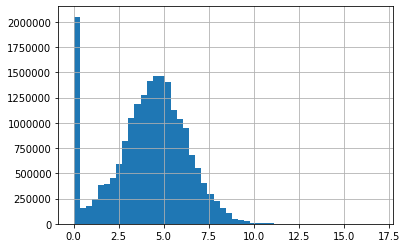

In [15]:
train_df['meter_reading_log1p'].hist(bins=50)
plt.show()

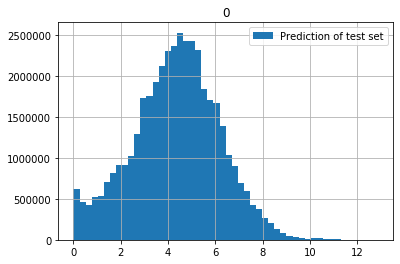

In [31]:
pd.DataFrame(np.log1p(y_test_pred)).hist(bins = 50, label = 'Prediction of test set')
plt.legend()
plt.show()

### Distribution of target variable in training set and predicted value

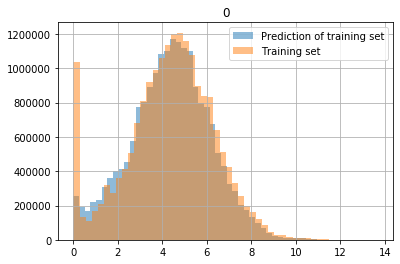

In [24]:
# sample, _ = train_test_split(np.log1p(y_test_pred), train_size=0.5)
# pd.DataFrame(sample).hist(bins = 50, label = 'Prediction of test set')
pd.DataFrame(np.log1p(y_train_pred)).hist(bins=50, label = 'Prediction of training set', alpha=0.5)
train_df['meter_reading_log1p'].hist(bins=50, label = 'Training set', alpha=0.5)
plt.legend()
plt.show()